# Segmentation of eye blood vessels

Libraries:

In [22]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
from skimage.filters import frangi, sobel
from skimage import exposure
from skimage.morphology import closing, disk, dilation, remove_small_objects, erosion
from skimage.segmentation import clear_border
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score
from scipy.stats import gmean

## Basic image processing

Loading data:

In [23]:
image_paths = [
    './images/im0002.png',
    './images/im0082.png', './images/im0163.png', 
    './images/im0235.png', './images/im0236.png'
]

labels_paths = [
    './labels/im0002.vk.png',
    './labels/im0082.vk.png', './labels/im0163.vk.png', 
    './labels/im0235.vk.png', './labels/im0236.vk.png'
]

images = [cv2.imread(path) for path in image_paths]
labels = [cv2.imread(path, cv2.IMREAD_GRAYSCALE) for path in labels_paths]
len(images), len(labels)

(5, 5)

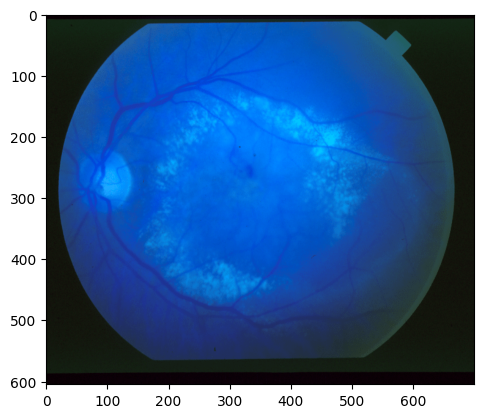

In [24]:
plt.imshow(images[0])

### Image preprocessing

In [25]:
def display_images(images, titles, cmap=None):
    fig, axes = plt.subplots(1, len(images), figsize=(20, 20))
    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img, cmap=cmap)
        ax.set_title(title)
        ax.axis('off')
    plt.show()

Separation of the green channel

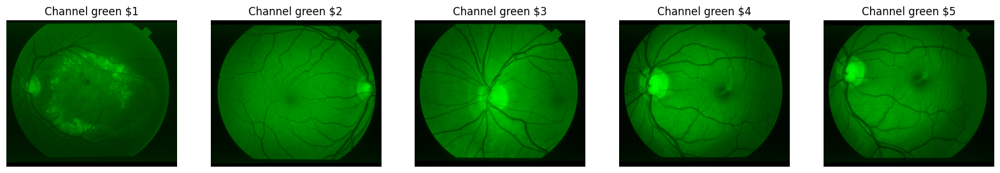

In [26]:
green_channel_images = []
for img in images:
    B, G, R = cv2.split(img)
    green_img = cv2.merge([np.zeros_like(B), G, np.zeros_like(R)])
    green_channel_images.append(green_img)

display_images(green_channel_images, [
    f"Channel green ${i+1}" for i in range(len(green_channel_images))
    ])

Histogram - distribution of brightness levels

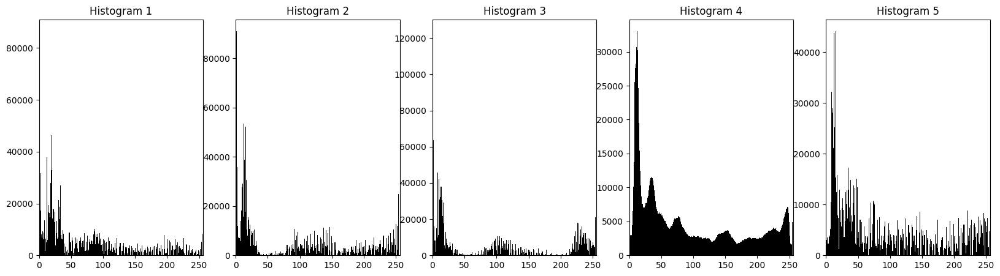

In [27]:
def display_histograms(images, titles):
    fig, axes = plt.subplots(1, len(images), figsize=(20, 5))
    for ax, img, title in zip(axes, images, titles):
        ax.hist(img.ravel(), bins=256, color='black')
        ax.set_title(title)
        ax.set_xlim([0, 256])
    plt.show()

display_histograms(images, [f'Histogram {i+1}' for i in range(len(images))])

**Gamma correction** - improves image contrast and brightness in a way that is more consistent with human perception

Gamma formula source: https://stackoverflow.com/questions/61695773/how-to-set-the-best-value-for-gamma-correction

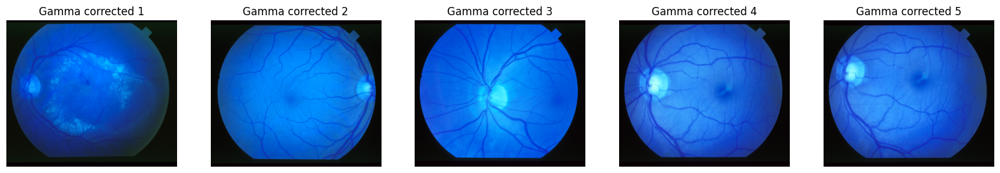

In [28]:
def compute_gamma_correction(img):
    mean = np.mean(img)
    mid = 0.5
    return math.log(mid * 255) / math.log(mean)

gamma_corrected = []
for img in images:
    gamma = compute_gamma_correction(img)
    img_gamma_corrected = np.power(img / 255.0, gamma) * 255.0
    img_gamma_corrected = img_gamma_corrected.clip(0, 255).astype(np.uint8)
    gamma_corrected.append(img_gamma_corrected)

display_images(gamma_corrected, [
    f'Gamma corrected {i+1}' for i in range(len(gamma_corrected))
    ])


Increases the contrast in darker areas and decreases it in lighter areas of the image

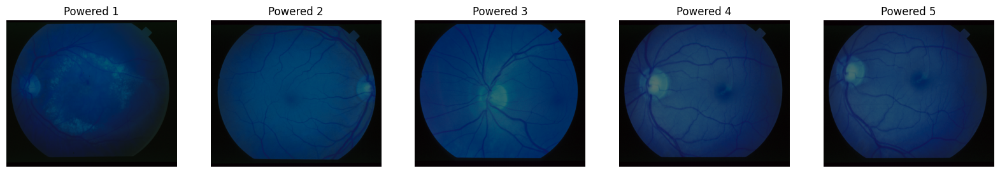

In [29]:
squared_images = [
  np.power(img, 0.85).clip(0, 255).astype(np.uint8) for img in gamma_corrected
]

display_images(squared_images, [
  f'Powered {i+1}' for i in range(len(squared_images))
  ])


Overall contrast increase

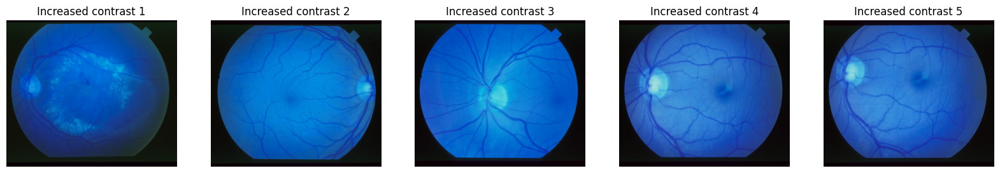

In [30]:
contrasted_images = [
  cv2.convertScaleAbs(img, alpha=2, beta=0) for img in squared_images
]

display_images(contrasted_images, [
  f'Increased contrast {i+1}' for i in range(len(contrasted_images))
  ])

**Morphological closure** - filling holes and gaps in objects, connecting closely located objects, removing minor imperfections

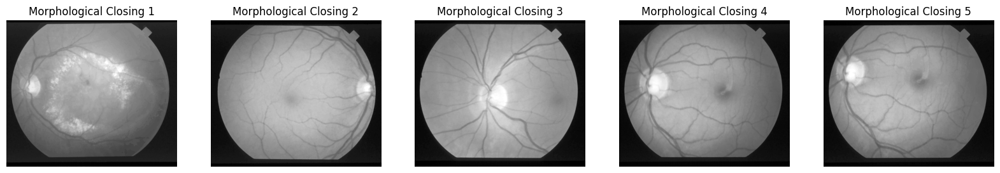

In [31]:
closed_images = [
  closing(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), disk(2)) for img in contrasted_images
]

display_images(closed_images, [
  f'Morphological Closing {i+1}' for i in range(len(closed_images))
  ], cmap='gray')


### Proper image processing

In [32]:
frangi_filtered = [frangi(img) for img in closed_images]
sobel_filtered = [sobel(img) for img in closed_images] # tests

Creating a binary mask

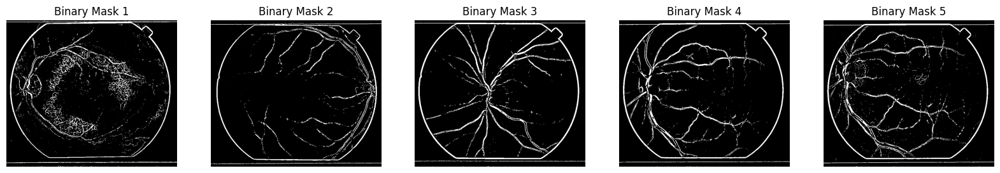

In [33]:
binary_masks = [
  (img > 0.0073).astype(np.uint8) for img in frangi_filtered
]

display_images(binary_masks, [
  f'Binary Mask {i+1}' for i in range(len(binary_masks))
  ], cmap='gray')

### Image post-processing; correcting errors from previous steps

**Morphological dilation** - combining close objects, filling holes, expanding objects

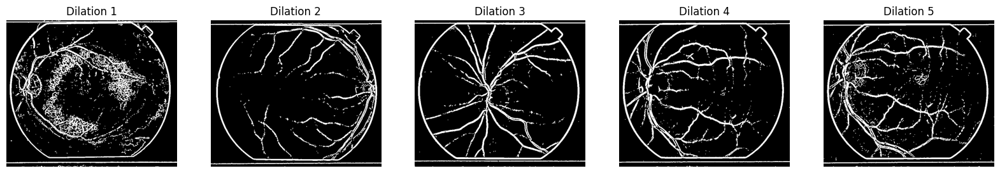

In [34]:
dilated_images = [
  dilation(img, disk(1)) for img in binary_masks
]

display_images(dilated_images, [
  f'Dilation {i+1}' for i in range(len(dilated_images))
], cmap='gray')

**Morphological erosion** - reducing the size of objects, removing noise, enhancing object separation

**Edge removal** - removal of unwanted elements, improving the quality of the analysis

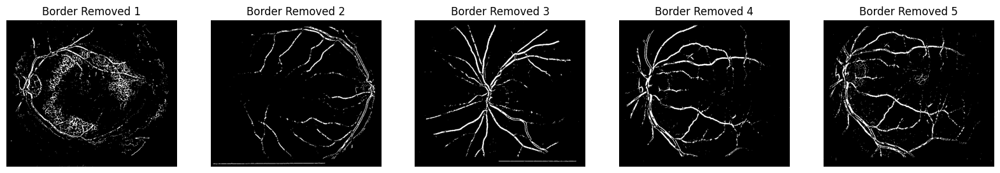

In [35]:
eroded_images = [
  erosion(img, disk(1)) for img in dilated_images
]

border_removed = [
  clear_border(img) for img in eroded_images
]

display_images(border_removed, [
  f'Border Removed {i+1}' for i in range(len(border_removed))
  ], cmap='gray')

Ultimate noise removal

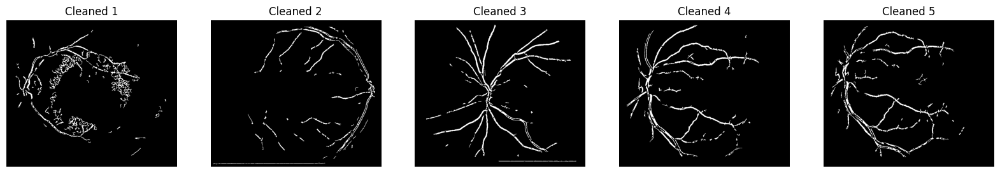

In [36]:
cleaned_images = [
  remove_small_objects(img.astype(bool), min_size=25).astype(np.uint8) for img in border_removed
]

display_images(cleaned_images, [
  f'Cleaned {i+1}' for i in range(len(cleaned_images))
  ], cmap='gray')

### Results

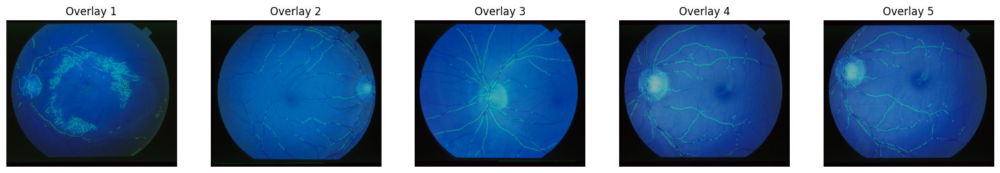

In [37]:
def mask_on_image(image, mask):
    mask_colored = np.zeros_like(image)
    mask_colored[:, :, 1] = mask * 255
    return cv2.addWeighted(image, 0.7, mask_colored, 0.3, 0)
    

overlaid_images = [
    mask_on_image(images[i], cleaned_images[i]) for i in range(len(images))
]

display_images(overlaid_images, [
    f'Overlay {i+1}' for i in range(len(overlaid_images))
    ])


Saving the resulting masks

In [38]:
import os
output_dir = './results'

pred_labels = []

for i, img in enumerate(cleaned_images):
    img_to_save = (img * 255).astype(np.uint8)
    output_path = os.path.join(output_dir, f'mask_{i+1}.png')
    cv2.imwrite(output_path, img_to_save)

### Statistical analysis

In [39]:
def calculate_metrics(y_true, y_pred, border):
  valid_mask = (border.ravel() == 0)

  y_true_filtered = y_true[valid_mask]
  y_pred_filtered = y_pred[valid_mask]

  tn, fp, fn, tp = confusion_matrix(
      y_true_filtered, 
      y_pred_filtered, 
      labels=[0, 1]
  ).ravel()
  
  accuracy = (tp + tn) / (tp + tn + fp + fn)
  sensitivity = tp / (tp + fn)  # 
  specificity = tn / (tn + fp)  # 
  return accuracy, sensitivity, specificity

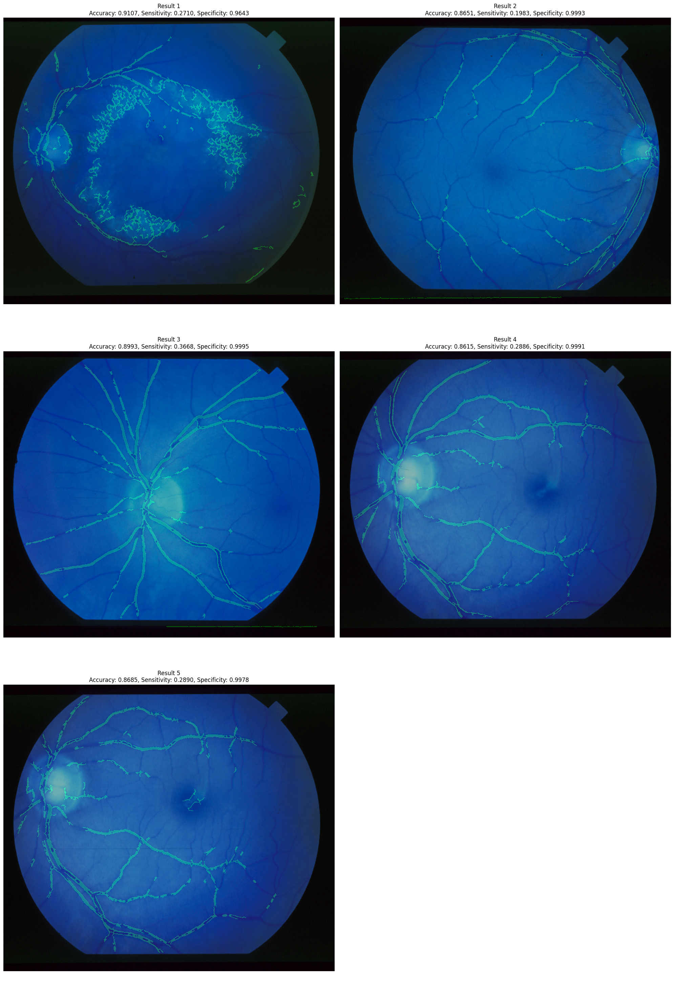

In [40]:
results = []

for idx, (ref, pred, original) in enumerate(zip(labels, cleaned_images, images)): 
    
    # looking for border in original img
    gray_image = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
    _, binary_mask = cv2.threshold(gray_image, 50, 255, cv2.THRESH_BINARY_INV)
    original_border_mask = closing(binary_mask, disk(10))


    # float -> int
    ref_bin = (ref / 255).astype(int)
    
    accuracy, sensitivity, specificity = calculate_metrics(ref_bin.ravel(), pred.ravel(), original_border_mask)
    results.append({
        'image': image_paths[idx],
        'accuracy': accuracy,
        'sensitivity': sensitivity,
        'specificity': specificity
    })

overall_accuracy = np.mean([result['accuracy'] for result in results])
overall_sensitivity = np.mean([result['sensitivity'] for result in results])
overall_specificity = np.mean([result['specificity'] for result in results])
geometric_mean = gmean([overall_sensitivity, overall_specificity]) if overall_sensitivity > 0 and overall_specificity > 0 else 0

num_cols = 2
num_rows = (len(overlaid_images) + num_cols - 1) // num_cols
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 10 * num_rows))
axes = axes.flatten()

for i, (img, result) in enumerate(zip(overlaid_images, results)):
    ax_img = axes[i]
    ax_img.imshow(img)
    ax_img.set_title(f"Result {i+1}\n"
                     f"Accuracy: {result['accuracy']:.4f}, "
                     f"Sensitivity: {result['sensitivity']:.4f}, "
                     f"Specificity: {result['specificity']:.4f}")
    ax_img.axis('off')

for i in range(len(overlaid_images), len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

In [41]:
print(f"Overall Accuracy: {overall_accuracy:.4f}")
print(f"Overall Sensitivity: {overall_sensitivity:.4f}")
print(f"Overall Specificity: {overall_specificity:.4f}")
print(f"Geometric Mean of Sensitivity and Specificity: {geometric_mean:.4f}")

Overall Accuracy: 0.8810
Overall Sensitivity: 0.2828
Overall Specificity: 0.9920
Geometric Mean of Sensitivity and Specificity: 0.5296
